# Pandemie-Simulation mit dem SEIR-Modell

Das SEIR-Modell zur mathematischen Modellierung der Ausbreitung von Infektionskrankheiten teilt die Individuen einer Population in vier Gruppen ein. *S (Suspectible)* beschreibt die Anzahl der Individuen, welche für eine Infektion anfällig sind. Individuen der Gruppe *E (Exposed)* sind bereits infiziert, aber selbst noch nicht infektiös. Die Anzahl der infektiösen Individuen wird mit *I (Infectious)* und die der Genesenen mit *R (Recovered)* bezeichnet. Die Anzahl der Individuen in jeder Gruppe hängt von der Zeit *t* ab. Formal gehört jedes Individum der Gesamtmenge *N* genau einer der vier Gruppe an. Formal lässt sich dieser Zusammenhang für alle $t\geq 0$ wie folgt darstellen:

\begin{align}
S(t)+E(t)+I(t)+R(t) = N
\end{align}

Man beachte insbesondere, dass die Größe der Population als konstant angenommen und schließt eine demographische Dynamik aus.

Die Ausbreitungsdynamik im SEIR-Modell lässt sich durch das folgende System gewöhnlicher Differentialgleichungen (DGL) beschreiben:

\begin{align}
\frac{dS(t)}{dt} &=-\frac{1}{N}\beta S(t)I(t) \\
\frac{dE(t)}{dt} &=\frac{1}{N}\beta S(t)I(t) - \alpha E(t) \\\
\frac{dI(t)}{dt} &=\alpha E(t) - \gamma I(t) \\
\frac{dR(t)}{dt} &=\gamma I(t)
\end{align}

wobei $\alpha$, $\beta$ und $\gamma$ als Parameter jeweils der Übergangs-, Transmissions- und Erholungsrate entsprechen.

In diesem Projekt wollen wir das Infektionsgeschehen zum Anfang der Corona-Pandemie in Deutschland ab März 2020 anhand von zwei Ansätzen utnersuchen: (i) einen deterministischen Ansatz, für welchen das obige DGL-System numerisch gelöst wird und (ii) einen stochastischen Ansatz bei dem das Infektionsgeschehen mit einer diskreten Markov-Kette simuliert wird. Letzterer Ansatz bietet unter anderem den Vorteil, dass der Unsicherheit bei der Prognose von Pandemie-Verläufen Sorge getragen wird und die Schwankungsbreite der Verläufe betrachtet werden kann. Der stochasische Ansatz bietet uns damit auch die Möglichkeit zu untersuchen, wie wahrscheinlich ein vorzeitiges Erliegen der Pandemie im Frühjahr 2020 gewesen wäre.

Für die nachfolgende Analyse wird eine Kalbirierung des SEIR-Modells gewählt, die sich an realen Daten für die Entwicklung der Covid-19-Pandemie in Deutschland aus 03/2020 orientiert. Diese Daten entstammen den Quellen www.rki.de und www.destatis.de.

Nachfolgende Daten konnten zum Frühstadium der Pandemie in 03/2020 recherchiert werden:
- Bevölkerungszahl Deutschland 03/2020: 83.157.201
- Basisreproduktionsrate $R_{0}$ zum 16.03.2020: ~2.0
- Infektionen Stand 23.03.2020: 22.672 
- Mittlere Latenzzeit: 3 Tage
- Infektiosität: 10 Tage

Um die Pandemieentwicklung mit vertretbarem Aufwand simulieren zu können, werden die Werte für die Einwohnerzahl Deutschlands und die Anzahl der Infizierten im Faktor 10.000 reduziert. Weiterhin werden 4 Kontaktpersonen (Exposed) pro infizierter Person zum Start der Simulation (Zeitpunkt $t_{0}$) angenommen.
- $N$ = 8.315,72
- $I_{0}$ = 2,27
- $E_{0}$ = 9,08

Aus der mittleren Latenzzeit, der Infektiosität sowie dem Zusammenhang zwischen den Parametern im Modell und der Basisreproduktionsrate ($R_{0} = \frac{\beta}{\gamma}$) lassen sich $\alpha$, $\beta$ und $\gamma$ ermitteln:
- $\alpha$ = 1.0/3.0
- $\beta$ = 2.0/10.0
- $\gamma$ = 1.0/10.0

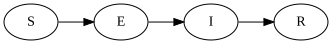

In [1]:
# Bei erster Verwendung Installation ausführen:
# import sys
# !conda install --yes --prefix {sys.prefix} python
# !conda install --yes --prefix {sys.prefix} python-graphviz

from graphviz import Digraph 
  
dot = Digraph() 
dot.graph_attr['rankdir'] = 'LR'  
  
dot.node('S', 'S')
dot.node('E', 'E') 
dot.node('I', 'I') 
dot.node('R', 'R') 
  
dot.edges(['SE', 'EI', 'IR']) 
  
#dot.format = 'png'
dot.render('Graph')

dot

## 1. Deterministischer Ansatz

Der gängigste Ansatz zur Simulation mit dem SEIR-Modell ist das Lösen des obigen DGL-Systems. Dies lässt sich performant mit dem DGL-Löser Scipy Bibliothek durchführen. Zunächste laden wir also die Scipy Bibliothek und weitere im Rahmen der Simulation nützliche Bibliotheken.

In [2]:
import numpy as np
import scipy.integrate as spi
import matplotlib as mpl 
import matplotlib.pyplot as plt 
import warnings
from matplotlib import MatplotlibDeprecationWarning
warnings.filterwarnings('ignore', category=MatplotlibDeprecationWarning)

Nun implementieren wir das obige DGL-System als Python-Funktion.

In [5]:
def dgl(t,x):
    
    y = np.zeros(4)
    
    y[0] = -beta*x[0]*x[2]/N
    y[1] = beta*x[0]*x[2]/N-alpha*x[1]
    y[2] = alpha*x[1]-gamma*x[2]
    y[3] = gamma*x[2]
    
    return y

Es folgt die Festlegung der Parameter und der Startwerte.

In [6]:
alpha = 1.0/3.0
beta = 2.0/10.0
gamma = 1/10.0
N = 8315.72

tmax = 300
dt = 0.001
t = np.arange(0.0, tmax, dt)

i0 = 2.27
e0 = 9.08

s0 = N - e0 - i0

Nun rufen wir den vorimplementierten DGL-Solver auf.

In [7]:
x0 = np.array([s0,e0,i0,0])
res = spi.solve_ivp(dgl,[0, tmax], x0, t_eval=t)

Abschließend veranschaulichen wir das Resultat mit einem Plot.

Text(0.5, 0, 't')

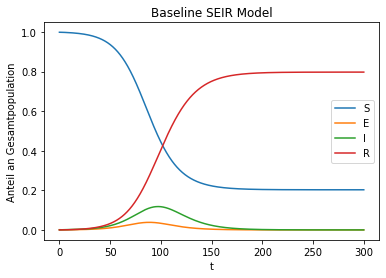

In [8]:
fig, ax = plt.subplots()
ax.plot(t, res.y[0]/N, label="S")
ax.plot(t, res.y[1]/N, label="E")
ax.plot(t, res.y[2]/N, label="I")
ax.plot(t, res.y[3]/N, label="R")
ax.legend()
ax.set_title("Baseline SEIR Model")
ax.set_ylabel("Anteil an Gesamtpopulation")
ax.set_xlabel("t")

## 2. Stochastischer Ansatz

Ein Nachteil des deterministischen Ansatzes ist, dass sich mit diesem lediglich ein durchschnittlicher Pandemieverlauf beschreiben lässt. Über einen stochastischer Ansatz  lassen sich dagegen verschiedene mögliche Verläufe simulieren und die Schwankungsbreite zwischen diesen Verläufen zu analysieren. Ein Szenario von besonderer Bedeutung in diesem Zusammenhang ist, dass die Pandemie bei einer geringen Anzahl von initial infizierten Individuen vorzeitig zum Erliegen kommt.

### 2.1 Grundlagen

Bei der stochastischen Version, modelliert man die Ausbreitungsdynamik anstatt mit einem DGL-System mit einer diskreten Markov-Kette der 3-dimensionalen Zustandsvariable (S,E,I). Die Übergänge werden dann durch die Wahrscheinlichkeitsfunktion

\begin{align}
    P(S=x, E=y, I=z) = \begin{cases} 
    \frac{1}{N}\beta s i \Delta t, \qquad\qquad &\text{wenn } (x,y,z) = (s-1, e+1, i)\\
    \alpha e \Delta t, &\text{wenn } (x,y,z) = (s, e-1, i+1)\\
    \gamma i\Delta t, &\text{wenn } (x,y,z) = (s, e, i-1) \\
    1-\left(\frac{1}{N}\beta s i + \alpha e +\gamma i\right)\Delta t, &\text{wenn } (x,y,z) = (s, e, i) \\
    0,  &\text{sonst } 
    \end{cases} 
\end{align}

Anschaulich findet in jedem Zeitschritt $\Delta t$ eines von fünf möglichen Ereignissen statt. Eine Infektion, ein Übergang ins Infektiöse, eine Erholung oder ein Verharren im aktuellen Zustand. Der Zeitschritt $\Delta t$ muss dabei so klein gewählt sein, dass die obige Wahrscheinlichkeit im Intervall $\left[0,1\right]$ liegen und sich zu 1 aufsummieren.

Für den stochastischen Ansatzes implementieren wir zunächst eine Funktion simulate_seir(), welche einen Zeitverlauf der Pandemie simuliert. Wir nutzen dazu die Funktion multinomial() aus der numpy.random Bibliothek, um passende Zufallszahlen zu generieren. 

In [9]:
import numpy.random as rm

def simulate_seir(dt, tmax, alpha, beta, gamma, N, i0, e0):
    # SEIR-Simulation nach dem stochastischen Modell und Ausgabe der Werte für S, E, I, und R
    
    t = np.arange(0.0, tmax, dt)
    s0 = N - e0 - i0
    
    I = np.zeros_like(t)
    I[0] = i0

    E = np.zeros_like(t)
    E[0] = e0

    S = np.zeros_like(t)
    S[0] = s0
    
    R = np.zeros_like(t)


    for l in range(1,len(t)):
        # Compute transition probabilities
        p1 = max(beta*S[l-1]*I[l-1]*dt/N, 0)
        p2 = max(alpha*E[l-1]*dt, 0)
        p3 = max(gamma*I[l-1]*dt, 0)
        
        draw = rm.multinomial(1, np.array([p1,p2,p3,0]))

        if draw[0] == 1:   # Infektion
            S[l] = S[l-1]-1
            E[l] = E[l-1]+1
            I[l] = I[l-1]
        elif draw[1] == 1: # Infektioes werden
            S[l] = S[l-1]
            E[l] = E[l-1]-1
            I[l] = I[l-1]+1
        elif draw[2] == 1: # Genesung
            S[l] = S[l-1]
            E[l] = E[l-1]
            I[l] = I[l-1]-1
        else:              # Kein Ereignis
            S[l] = S[l-1]
            E[l] = E[l-1]
            I[l] = I[l-1]
    
    # Initialisieren von R mit Wert N
    for i in range(len(R)):
        R[i] = N
    
    # Ermittlung von R
    R = R - (S + E + I)
            
    return S, E, I, R


In [10]:
s_data = simulate_seir(dt, tmax, alpha, beta, gamma, N, i0, e0)

### 2.2 Animation eines Pandemie-Verlaufs

Wir illustrieren die stochastische Lösung durch eine Animation der Exponierten-Anteils E/N.

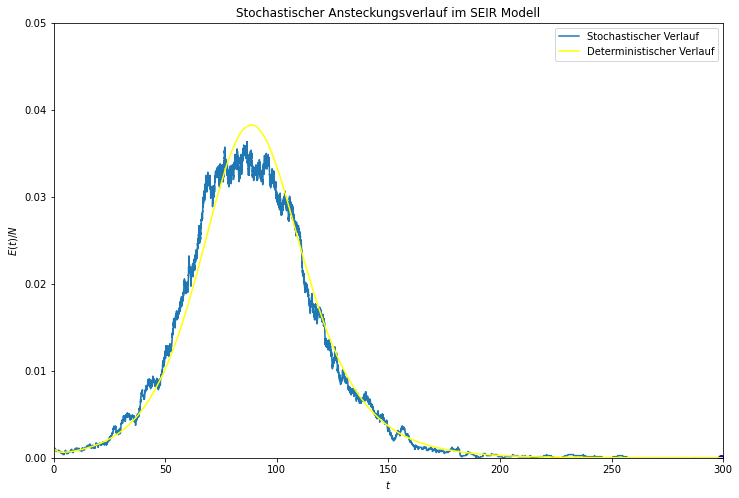

In [12]:
from matplotlib.animation import FuncAnimation
from matplotlib import rc
rc('animation', html='jshtml')
fig, ax = plt.subplots(figsize=(12,8))

ax.set_xlabel(r'$t$')
ax.set_ylabel(r'$E(t)/N$')
ax.set_xlim(0, 300)
ax.set_ylim(0, 0.05)

# Erzeuge einen leeren Plot
plot, = ax.plot([], [], label="Stochastischer Verlauf")
Eplot, = ax.plot([], [], 'o', color='blue')
ax.plot(t, res.y[1]/N, label="Deterministischer Verlauf", color='yellow')
ax.legend()
ax.set_title("Stochastischer Ansteckungsverlauf im SEIR Modell")

E = s_data[1]

def update(n):
    Eplot.set_data(np.array([t[1000*n], (E[1000*n]/N)]))
    # Plotte die Plotte die Kurve der Exponierten-Anzahl bis zum aktuellen Zeitpunkt
    plot.set_data(t[:(1000*n) + 1], E[:(1000*n) + 1]/N)
    return Eplot,

ani = mpl.animation.FuncAnimation(fig, update, interval=100, frames=int(t.size/1000), blit=True)
ani

Anhand der Animation erkennt man, dass der Verlauf der Pandemie um den deterministischen Verlauf schwankt. Letzterer kann als mittlerer Verlauf einer möglichen Pandemie verstanden werden. Passend dazu werden wird die weitere Analyse zeigen, dass der deterministische Verlauf dem durchschnittlichen Verlauf im stochastischen Modell entspricht.

### 2.2 Laufzeitbetrachtung und -optimierung

Nun wollen wir die Simulationsfunktion hinsichtlich ihrer Laufzeit betrachten und optimieren.

In [17]:
%timeit simulate_seir(dt, tmax, alpha, beta, gamma, N, i0, e0)

5.6 s ± 67.2 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


Mithilfe der just-in-time-Funktion aus der Numba Bibliothek lässt sich die Laufzeit der Funktion beträchtlich reduzieren.

In [21]:
import numba as nb

@nb.jit()
def simulate_seir_numba(dt, tmax, alpha, beta, gamma, N, i0, e0):
    # SEIR-Simulation nach dem stochastischen Modell und Ausgabe der Werte für S, E, I, und R
    
    t = np.arange(0.0, tmax, dt)
    s0 = N - e0 - i0
    
    I = np.zeros_like(t)
    I[0] = i0

    E = np.zeros_like(t)
    E[0] = e0

    S = np.zeros_like(t)
    S[0] = s0
    
    R = np.zeros_like(t)


    for l in range(1,len(t)):
        # Compute transition probabilities
        p1 = max(beta*S[l-1]*I[l-1]*dt/N, 0)
        p2 = max(alpha*E[l-1]*dt, 0)
        p3 = max(gamma*I[l-1]*dt, 0)

        draw = rm.multinomial(1, np.array([p1,p2,p3,0]))

        if draw[0] == 1:   # Infektion
            S[l] = S[l-1]-1
            E[l] = E[l-1]+1
            I[l] = I[l-1]
        elif draw[1] == 1: # Infektioes werden
            S[l] = S[l-1]
            E[l] = E[l-1]-1
            I[l] = I[l-1]+1
        elif draw[2] == 1: # Genesung
            S[l] = S[l-1]
            E[l] = E[l-1]
            I[l] = I[l-1]-1
        else:              # Kein Ereignis
            S[l] = S[l-1]
            E[l] = E[l-1]
            I[l] = I[l-1]
    
    # Initialisieren von R mit Wert N
    for i in range(len(R)):
        R[i] = N
    
    # Ermittlung von R
    R = R - (S + E + I)
            
    return S, E, I, R

In [22]:
%timeit simulate_seir_numba(dt, tmax, alpha, beta, gamma, N, i0, e0)

125 ms ± 13.6 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


Nachfolgend werden die Laufzeiten der ursprünglichen Funktion und der mit der Numba Bibliothek optimierten Version in einem Diagramm gegenübergestellt.

Text(0, 0.5, 'Laufzeit [ms]')

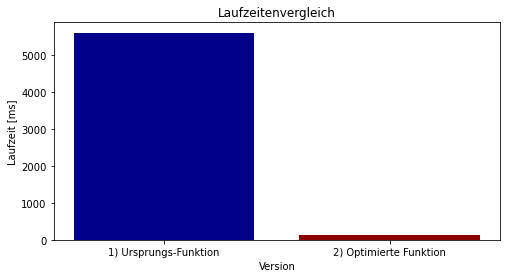

In [28]:
# Darstellung des Graphen für die Laufzeiten
plt.figure(figsize = [8, 4])
c = ['darkblue', 'darkred']
plt.bar(['1) Ursprungs-Funktion', '2) Optimierte Funktion'], [5600, 125], color = c)
plt.title('Laufzeitenvergleich')
plt.xlabel('Version')
plt.ylabel('Laufzeit [ms]')

Die Laufzeit der Funktion "simulate_seir" konnte mithilfe der Numba Bibliothek auf ca. 2 Prozent der ursprünglichen Laufzeit reduziert werden. Dieser Optimierungserfolg ist essentiell, um nachfolgend eine große Anzahl möglicher Pandemieverläufe nach dem stochastischen Modell simulieren zu können.

## 3. Simulations-Studie zu möglichen Pandemie-Verlauf
Ein großer Vorteil des stochastischen Ansatzes ist es, dass die Schwankungsbreite möglicher Pandemieverläufe untersucht werden kann. Dazu simulieren wir einen Datensatz von J=1000 Pandemie-Verläufen.

In [30]:
from numba import  njit, prange

def simulation(J):
    for j in prange(0,J): 
        data = simulate_seir_numba(dt, tmax, alpha, beta, gamma, N, i0, e0)
        S[:,j] = data[0]
        E[:,j] = data[1]
        I[:,j] = data[2]
        R[:,j] = data[3]

In [37]:
J = 1000;
rm.seed(1)

R = np.zeros((len(t),J))
I = np.zeros((len(t),J))
E = np.zeros((len(t),J))
S = np.zeros((len(t),J))


simulation(J);

Zur vereinfachten Berechnung statistischer Kennzahlen verwenden wir die Pandas Library. Zunächst erstellen wir einen Plot, welcher den durchschnittlichen Anteil der Infizierten (Exponierte + Infektiöse) zusammen mit 90% Konfidenzbändern zeigt, also die Schwankungsbreite, in welcher sich 90 Prozent der Pandemie-Verläufe bewegen.

In [38]:
import pandas as pd

InfectedData = pd.DataFrame(I+E)
mean = InfectedData.mean(axis=1)/N;
qhigh = InfectedData.quantile(axis=1, q=0.95)/N;
qlow = InfectedData.quantile(axis=1, q=0.05)/N

Text(0.5, 0, 't')

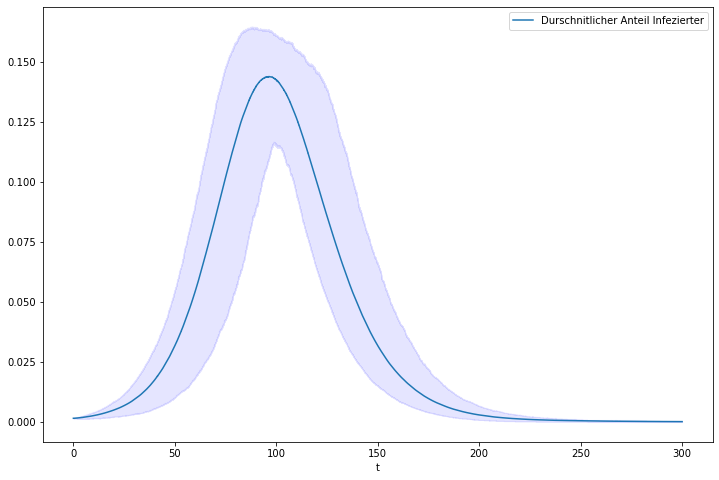

In [39]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(t, mean, label="Durschnitlicher Anteil Infezierter")
ax.plot(t, qhigh, color = "blue", alpha = 0.01)
ax.plot(t, qlow, color = "blue", alpha = 0.01)
ax.fill_between(t, qlow, qhigh, color = "blue", alpha = 0.1)
ax.legend()
ax.set_title("")
ax.set_ylabel("")
ax.set_xlabel("t")

Die Grafik veranschaulicht, dass die Entwicklung der Infiziertenzahl im Mittel der des deterministischen Ansatzes entspricht. Die Schwankungsbreite ist aber nicht unerheblich. Dies ist insbesondere vor dem Hintergrund beschränkter Kapazitäten in der medizinischen Versorgung zu beachten, da es hier gegebenfalls zu Engpässen kommen kann.

Weiterhin gibt die Grafik Aufschluss über Extrem-Szenarien. Die maximale Zahl an gleichzeitig Infizierten in den J=1000 Szenarien, lässt sich wie folgt berechnen:

In [40]:
np.max(InfectedData.max(axis=0)/N)

0.18415122202286754

In einem besonders extremen Verlauf der Pandemie wären also grob 18,5% der Bevölkerung zu einem Zeitpunkt gleichzeitig infiziert. Das Minimum lässt sich wie folg ermitteln: 

In [41]:
np.min(InfectedData.max(axis=0)/N)

0.12811277917005381

Im mildesten Verlauf der 1000 Pandemie-Szenarien wären etwa 13% der Bevölkerung zu einem Zeitpunkt gleichzeitig infiziert, was immernoch erheblich ist. Für die 1000 Simulationen kommt die Pandemie in keinem einzigen Fall vorzeitig zum Erliegen.

Weiter betrachten wir die Spitzen der einzelnen Gruppen:

In [42]:
S = pd.DataFrame(S)
E = pd.DataFrame(E)
I = pd.DataFrame(I)
R = pd.DataFrame(R)

In [43]:
Tab = pd.DataFrame()
Tab["Group"] = ["Suspected", "Exposed", "Infected", "Recovered"]
Tab["Median Peak"] = [np.median(S.max(axis=0)/N), np.median(E.max(axis=0)/N), np.median(I.max(axis=0)/N), np.median(R.max(axis=0)/N)]
Tab["Maximal Peak"] = [np.max(S.max(axis=0)/N), np.max(E.max(axis=0)/N), np.max(I.max(axis=0)/N), np.max(R.max(axis=0)/N)]
Tab["Minimal Peak"] = [np.min(S.max(axis=0)/N), np.min(E.max(axis=0)/N), np.min(I.max(axis=0)/N), np.min(R.max(axis=0)/N)]

In [44]:
Tab

,Group,Median Peak,Maximal Peak,Minimal Peak
0,Suspected,0.998635,0.998635,0.998635
1,Exposed,0.041497,0.049675,0.033440
2,Infected,0.121068,0.143375,0.098400
3,Recovered,0.797526,0.827228,0.743171


Die Tabelle zeigt, dass die Verläufe ohne Maßnahmen zur Pandemiebekämpfung in ihren Spitzenwerten nicht allzu stark variieren. Die Aufschlüsselung der oben betrachteten Infizierten in Exponierte und (E) und Infizierte (I) zeigt, dass Letztere mit etwa 75% den größeren Anteil ausmachen und diese Verteilung nahezu unabhängig von der Schwere des Pandemie-Verlaufs ist.
Der Anteil der Bevölkerung, welche eine Infektion durchgemacht haben, also am Ende der Pandemie der Gruppe S zugeordnet werden, zwischen 75,7% im mildesten und 82.9% im schwersten Verlauf schwankt. Im Folgenden stellen wir die beiden Verläufe und den durchschnittlichen Verlauf der Pandemie in einem Diagramm dar.

In [45]:
# Ausgabe der Simulationsdaten für den 'mildesten' Pandemieverlauf
def return_min_progression(df):
    return np.array(df.iloc[:, df.iloc[-1,:].idxmax()])

# Ausgabe der Simulationsdaten für den "schwersten" Pandemieverlauf
def return_max_progression(df):
    return np.array(df.iloc[:, df.iloc[-1,:].idxmin()])

# Ausgabe der der Durchschnittswerte über die Zeilen im DataFrame
def return_mean(df):
    df_help = pd.DataFrame()
    df_help['average'] = df.mean(axis = 1)
    return df_help['average']

Text(0.5, 0, 't')

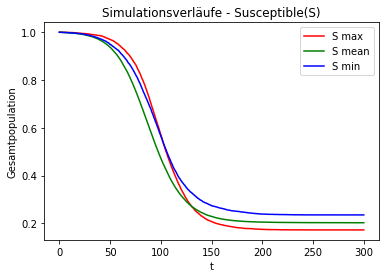

In [46]:
# Identifizierung der Extrem- und Durchschnittsverläufe anhand der Simulationsdaten
SusceptiblesMin = return_min_progression(S)
SusceptiblesMax = return_max_progression(S)
SusceptiblesMean = return_mean(S)

fig, ax = plt.subplots()
ax.plot(t, SusceptiblesMax/N, label="S max", color = "r")
ax.plot(t, SusceptiblesMean/N, label="S mean", color = "g")
ax.plot(t, SusceptiblesMin/N, label="S min", color = "b")
ax.legend()
ax.set_title("Simulationsverläufe - Susceptible(S)")
ax.set_ylabel("Gesamtpopulation")
ax.set_xlabel("t")

Das Diagramm zeigt die Simulationsdurchläufe, mit dem mildesten, schwersten und durchnittlichen Pandemie-Verlauf, gemessen anhand der Endwerte in der Gruppe S. Im schwersten Verlauf waren ca. 82,9% der Bevölkerung vom Infektionsgeschehen betroffen. Im mildesten Verlauf galt dies für 75,7% der Bevölkerung. Auffällig ist auch, dass sich die Entwicklung in der Gruppe S für den mildesten und schwersten Pandemieverlauf zum Beginn der Simulation recht ähnlich darstellt. Erst nach t=150 Tagen zeichnen sich die extremen Verläufe im Diagramm ab.

Abschließend lässt sich festhalten, dass die Pandemie ohne Gegenmaßnahmen verschieden schwer oder mild verlaufen kann, sich die Extremverläufe aber nicht grundlegend unterscheiden. Genererell ist in jedem beobachteten Verlauf wegen der gleichzeitigen Erkrankung von 13 bis 18,5 Prozent der Bevölkerung eine Überbelastung der Gesundheitssystems zu erwarten. Im Folgenden wollen wir erörtern, wie sich dies durch geeignete Qarantäne-Maßnahmen verhindern ließe.

## 4. Erweiterung des SEIR-Modells mit Quarantäne-Maßnahmen

Im zuvor eingeführten SEIR-Modells sind wir davon ausgegangen, dass sich das Virus ohne Gegenmaßnahmen verbreiten kann. Nun erweitern wir das SEIR-Modell um Quarantäne-Maßnahmen und betrachten deren Auswirkungen auf die Schwankungsbreite der Pademie-Verläufe. 

Wir führen einen neuen Zustand *Q* ein. Diesem werden Indiviuen zugeordnet, die in Gruppe *E* positiv getestet werden, aber aufgrund von Quarantänemaßnahmen kein Infektionsrisiko für Individuen der Klasse S mehr darstellen. Der neue Parameter $\rho$ stellt den Anteil an entdeckten und unter Quarantäne gestellten Exponierten dar. Mit der gleichen Genesungsrate, mit der die Indiviuen von *I* nach *R* wechseln, folgt der Wechsel von *Q* zu *R*. Zur Vereinfachung nehmen wir an, dass bereits Infektiöse nicht nachträglich als positiv anerkannt werden, also ein Wechsel von Gruppe *E* nach *I* nicht stattfindet.

Als weitere Pandemie-Schutzmaßnahme berücksichtigen wir die Möglichkeit auch Kontaktpersonen in Quarantäne zu schicken. Da die in Quarantäne gegangene Person aus dem Zustand *E* bei Kontakt noch nicht infektiös war, ist davon auszugehen, dass Kontaktpersonen asymptomatisch sind und nach der Quarantäne wieder in den Status *S* wechseln. Daher betrachten wir diese als eigene Klasse *C*. Der Parameter *k* stellt die durchnittliche Anzahl von Kontakpersonen dar und \eta die Dauer der Quarantäne-Maßnahme. Bezüglich der neuen Klasse C sei noch erwähnt, dass zwar durch die Annahme, dass nur Kontaktpersonen von Individuen der Klasse *E* in Quarantäne geschickt werden, diese aufgrund der mangelnden Infektiösität von E zwar hinfällig wäre, dies aber aus Sicht der Maßnahmendurchführer nicht ersichtlich ist. Vielmehr soll hier dem Effekt Sorge getragen werden, dass durch Isolierung der Kontaktpersonen die potentielle Menge an vulnerablen Individuen in S reduziert wird.

Das System von Differentialgleichungen erweitert sich wie folgt zum QC-SEIR-Modell:

\begin{align}
\frac{dS(t)}{dt} &=-\frac{1}{N}\beta S(t)I(t) -k\alpha \rho E(t) + \nu C(t) \\
\frac{dE(t)}{dt} &=\frac{1}{N}\beta S(t)I(t) - \alpha E(t) \\
\frac{dI(t)}{dt} &=\alpha (1-\rho) E(t) - \gamma I(t) \\
\frac{dQ(t)}{dt} &=\alpha \rho E(t) - \gamma Q(t) \\
\frac{dC(t)}{dt} &=k\alpha \rho E(t) - \eta C(t) \\
\frac{dR(t)}{dt} &=\gamma (I(t)+Q(t))
\end{align}

Man beachte, dass bei Abwesenheit von Quarantänemaßnahmen ($\rho = C(0) = Q(0) = 0$) das SEIR-Modell resultiert.

Die Zustandswechsel im QC-SEIR-Modell lassen sich wie folgt als gerichteter Graph darstellen:

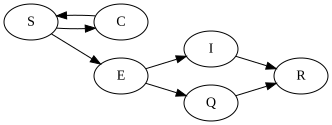

In [47]:
from graphviz import Digraph 
  
dot = Digraph() 
dot.graph_attr['rankdir'] = 'LR'  
  
dot.node('S', 'S')
dot.node('C', 'C') 
dot.node('E', 'E') 
dot.node('I', 'I') 
dot.node('Q', 'Q') 
dot.node('R', 'R') 
  
dot.edges(['SC', 'CS', 'SE', 'EI', 'IR', 'EQ', 'QR']) 
  
#dot.format = 'png'
dot.render('Graph')

dot

### 4.1 Deterministischer Ansatz

Wir betrachten zunächst wieder eine deterministische Implementierung des QC-SEIR-Models. Dazu implementieren wir wieder ein zu lösendes DGL-System mit der Funktion dgl_Q(t,x) und lösen dieses numerisch mit dem Solver der Scipy Bibliothek.

In [48]:
def dgl_Q(t,x):
    y = np.zeros(6)
    
    y[0] = -beta*x[0]*x[2]/N - k*alpha*rho*x[1] + nu*x[4]
    y[1] = beta*x[0]*x[2]/N-alpha*x[1]
    y[2] = alpha*(1-rho)*x[1]-gamma*x[2]
    y[3] = alpha*rho*x[1]-gamma*x[3]
    y[4] = k*alpha*rho*x[1] - nu*x[4]
    y[5] = gamma*(x[2]+x[3])
    
    return y

In [49]:
# Die Quanrantäne-Zeit wird gleich der Zeit eines Krankheitsverlaufs angenommen.
nu = gamma
x0 = np.array([s0,e0,i0,0,0,0])

# Modell ohne Maßnahmen (enstpricht SEIR-Modell)
k = 0
rho = 0
resQ0 = spi.solve_ivp(dgl_Q,[0, tmax], x0, t_eval=t)

# Modell mit Quarantänemaßnahme (1/5 der Exponierten werden erfolgreich isoliert) aber ohne Kontaktverfolgung
k = 0
rho = 1/5.0
resQ = spi.solve_ivp(dgl_Q,[0, tmax], x0, t_eval=t)

# Modell mit Quarantänemaßnahme (1/5 der Exponierten werden erfolgreich isoliert) und Quanrantäne von Kontaktpersonen (drchschn. 10 Pers.)
k=10
rho = 1/5.0
resQ2 = spi.solve_ivp(dgl_Q,[0, tmax], x0, t_eval=t)

Der Anteil von Exponierten, welche erfolgreich isoliert werden, also in den Status Q statt I übergehen, beträgt in der 
Simulation 1/5. Mit diesem vergleichsweise geringen Anteil wollen wir der Dunkelziffer an unentdeckten Infektionen Sorge tragen. 

#### 4.1.1 Anteil infizierter Personen

Wir plotten nun den Anteil der infizierten Personen der verschiedenen Modelle im Zeitverlauf.

Text(0.5, 0, 't')

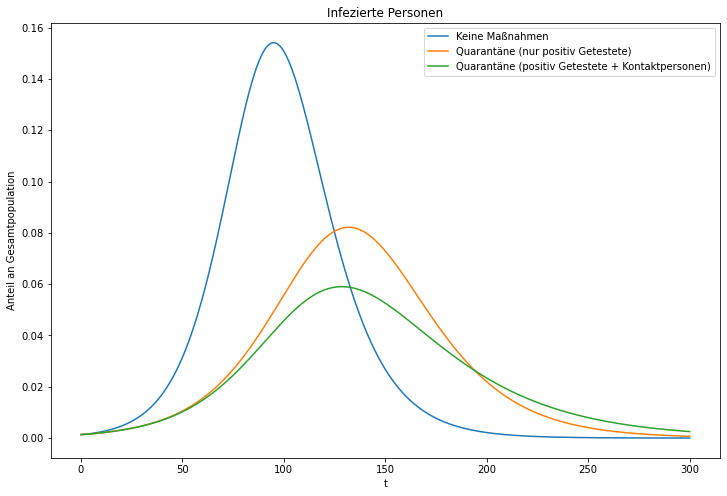

In [51]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(t, (resQ0.y[1]+resQ0.y[2]+resQ0.y[3])/N, label="Keine Maßnahmen")
ax.plot(t, (resQ.y[1]+resQ.y[2]+resQ.y[3])/N, label="Quarantäne (nur positiv Getestete)")
ax.plot(t, (resQ2.y[1]+resQ2.y[2]+resQ2.y[3])/N, label="Quarantäne (positiv Getestete + Kontaktpersonen)")
ax.legend()
ax.set_title("Infizierte Personen")
ax.set_ylabel("Anteil an Gesamtpopulation")
ax.set_xlabel("t")

Die Darstellung zeigt, dass der durchschnittliche Verlauf der Pandemie schon durch eine Quarantäne von einem Fünftel der positiv getesteten Exponierten erheblich entschleunigen ließe. Insbesondere reduziert sich die Spitze von etwa 15% Infizierter auf etwa 8%. Eine zusätzliche Isolierung von durchschnittlich 10 Kontaktpersonen pro isoliertem Exponierten verringert die Spitze um weitere ca. 2% im Durchschnitt. 

Es lässt sich ableiten, dass eine Isolierung Infizierter die Geschwindigkeit des Pandemie-Verlaufs und deren Spitzenwert im Durchschnitt erheblich reduziert und die Quarantäne zusätzlicher Kontaktpersonen insbesondere die Spitze der gleichzeitig Infizierten erheblich reduziert.

#### 4.1.2 Anteil genesener Personen

Um weitere Erkenntnisse zu den Auswirkungen von Quarantäne-Maßnahmen auf den Pandemie-Verlauf zu gewinnen, stellen wir die Anzahl der genesenen Individuen graphisch dar.

Text(0.5, 0, 't')

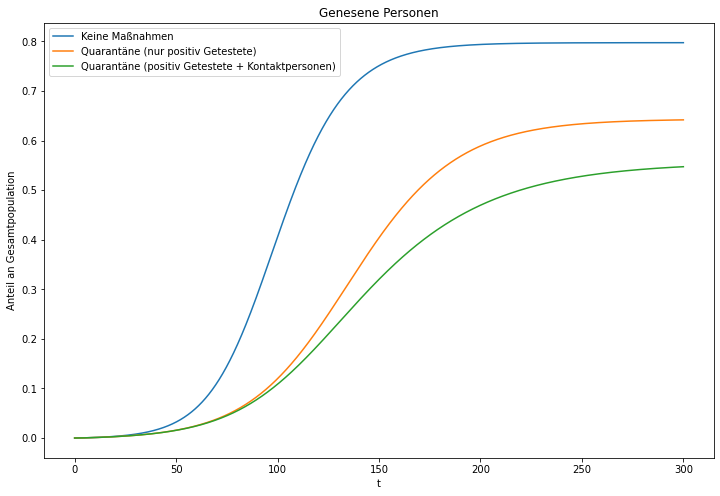

In [54]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(t, resQ0.y[5]/N, label="Keine Maßnahmen")
ax.plot(t, resQ.y[5]/N, label="Quarantäne (nur positiv Getestete)")
ax.plot(t, resQ2.y[5]/N, label="Quarantäne (positiv Getestete + Kontaktpersonen)")
ax.legend()
ax.set_title("Genesene Personen")
ax.set_ylabel("Anteil an Gesamtpopulation")
ax.set_xlabel("t")

In [53]:
print (f"Durchseuchungsrate ohne Gegenmaßnahmen {resQ0.y[5][-1]/N}")
print (f"Durchseuchungsrate mit Isolierung jedes 5. Exponierten {resQ.y[5][-1]/N}")
print (f"Durchseuchungsrate mit Isolierung jedes 5. Exponierten und 10 Kontaktpersonen {resQ2.y[5][-1]/N}")

Durchseuchungsrate ohne Gegenmaßnahmen 0.7972588134601964
Durchseuchungsrate mit Isolierung jedes 5. Exponierten 0.6416197476263046
Durchseuchungsrate mit Isolierung jedes 5. Exponierten und 10 Kontaktpersonen 0.5471514482354188


Wir sehen, dass die Quarantäne-Maßnahmen neben einer Reduktion der gleichzeitig Infizierten auch die Anzahl der Personen verringert, welche eine Infektion durchmachen. In unserer Modell-Kalibrierung wäre bei Abwesenheit von Gegenmaßnahmen eine Durchseuchnungsrate von etwa 80 Prozent zu erwarten, bevor die Pandemie zum Erliegen kommt. Bei Isolierung von Exponierten könnte diese auf etwa 64 Prozent, bzw. bei zusätzlicher Isolierung von Kontaktpersonen auf etwa 55 Prozent reduziert werden.

### 4.2 Stochastischer Ansatz

Zur weiteren Bewertung der Quarantäne-Maßnahmen betrachten wir nun sen stochastischen Ansatz über diskrete Markov-Ketten. Die Übergangswahrscheinlichkeiten für das QC-SEIR_Modell ergeben sich wie folgt:

\begin{align}
    P(S=x, E=y, I=z) = \begin{cases} 
    \frac{1}{N}\beta s i \Delta t, \qquad\qquad &\text{wenn } (v,w,x,y,z) = (q,c,s-1, e+1, i)\\
    \alpha (1-\rho)e \Delta t, &\text{wenn } (v,w,x,y,z) = (q,s, e-1, i+1)\\
    \alpha \rho e \Delta t, &\text{wenn } (v,w,x,y,z) = (q+1,s, e-1, i)\\
    \gamma i\Delta t, &\text{wenn } (v,w,x,y,z) = (q,c,s, e, i-1) \\
    \gamma q\Delta t, &\text{wenn } (v,w,x,y,z) = (q-1,c,s, e, i) \\
    \kappa\alpha\rho e\Delta t, &\text{wenn } (v,w,x,y,z) = (q,c+1,s-1, e, i) \\
    \nu c e\Delta t, &\text{wenn } (v,w,x,y,z) = (q,c-1,s+1, e, i) \\
    1-\left(\frac{1}{N}\beta s i + \alpha(1-\rho) e + \alpha\rho e +\gamma (i+q)\right)\Delta t, &\text{wenn } (v,w,x,y,z) = (q,c,s, e, i) \\
    0,  &\text{sonst } 
    \end{cases} 
\end{align}

Wie in der stochastischnen SEIR findet in jedem Zeitschritt $\Delta t$ ein mögliches Ereignis statt. Neben einer Infektion, einem Übergang ins Infektiöse, einer Erholung eines Infektiösen oder einem Verharren im aktuellen Zustand is es nun auch möglich, dass stattdessen ein Exponierter isoliert wird, eine Kontaktperson isoliert wird, eine Genesung eines symptomatisch Isolierten oder das Quarantäne-Ende einer Kontaktperson stattfindet. Der Zeitschritt $\Delta t$ muss dabei wieder so klein gewählt sein, dass die obigen Wahrscheinlichkeiten im Intervall $\left[0,1\right]$ liegen und sich zu 1 aufsummieren.

Für den stochastischen Ansatzes implementieren wir zunächst eine Funktion simulate_qcseir_numba(), welche einen Zeitverlauf der Pandemie simuliert. Über die Funktion simulation_QC() wird dann wieder einen Datensatz von J Pandemieverläufen erzeugt.

In [55]:
import numba as nb

@nb.jit()
def simulate_qcseir_numba(dt, tmax, alpha, beta, gamma, N, i0, e0):
    # SEIR-Simulation nach dem stochastischen Modell und Ausgabe der Werte für S, E, I, und R
    
    t = np.arange(0.0, tmax, dt)
    s0 = N - e0 - i0
    
    I = np.zeros_like(t)
    I[0] = i0

    E = np.zeros_like(t)
    E[0] = e0

    S = np.zeros_like(t)
    S[0] = s0
    
    Q = np.zeros_like(t)
    C = np.zeros_like(t)
    R = np.zeros_like(t)


    for l in range(1,len(t)):
        # Compute transition probabilities
        p1 = max(beta*S[l-1]*I[l-1]*dt/N, 0)
        p2 = max(alpha*(1-rho)*E[l-1]*dt, 0)
        p3 = max(alpha*rho*E[l-1]*dt, 0)
        p4 = max(gamma*I[l-1]*dt, 0)
        p5 = max(gamma*Q[l-1]*dt, 0)
        p6 = max(k*alpha*rho*E[l-1]*dt, 0)
        p7 = max(nu*C[l-1]*dt, 0)

        draw = rm.multinomial(1, np.array([p1,p2,p3,p4,p5,p6,p7,0]))

        if draw[0] == 1:   # Infektion
            Q[l] = Q[l-1]
            C[l] = C[l-1]
            S[l] = S[l-1]-1
            E[l] = E[l-1]+1
            I[l] = I[l-1]
        elif draw[1] == 1: # Infektioes werden
            Q[l] = Q[l-1]
            C[l] = C[l-1]
            S[l] = S[l-1]
            E[l] = E[l-1]-1
            I[l] = I[l-1]+1
        elif draw[2] == 1: # In Quarantäne gehen
            Q[l] = Q[l-1]+1
            C[l] = C[l-1]
            S[l] = S[l-1]
            E[l] = E[l-1]-1
            I[l] = I[l-1]
        elif draw[3] == 1: # Genesung
            Q[l] = Q[l-1]
            C[l] = C[l-1]
            S[l] = S[l-1]
            E[l] = E[l-1]
            I[l] = I[l-1]-1
        elif draw[4] == 1: # Genesung von isolierter Person
            Q[l] = Q[l-1]-1
            C[l] = C[l-1]
            S[l] = S[l-1]
            E[l] = E[l-1]
            I[l] = I[l-1]
        elif draw[5] == 1: # Isolation von Kontaktperson
            Q[l] = Q[l-1]
            C[l] = C[l-1]+1
            S[l] = S[l-1]-1
            E[l] = E[l-1]
            I[l] = I[l-1]
        elif draw[6] == 1: # Kontaktperson verlässt Isolation
            Q[l] = Q[l-1]
            C[l] = C[l-1]-1
            S[l] = S[l-1]+1
            E[l] = E[l-1]
            I[l] = I[l-1]
        else:              # Kein Ereignis
            Q[l] = Q[l-1]
            C[l] = C[l-1]
            S[l] = S[l-1]
            E[l] = E[l-1]
            I[l] = I[l-1]
    
    # Initialisieren von R mit Wert N
    for i in range(len(R)):
        R[i] = N
    
    # Ermittlung von R
    R = R - (S + E + I)
            
    return Q, C, S, E, I, R

In [56]:
def simulation_QC(J):
    for j in prange(0,J): 
        data = simulate_qcseir_numba(dt, tmax, alpha, beta, gamma, N, i0, e0)
        Q[:,j] = data[0]
        C[:,j] = data[1]
        S[:,j] = data[2]
        E[:,j] = data[3]
        I[:,j] = data[4]
        R[:,j] = data[5]

Im Folgenden simulieren wir Verläufe bei Isolierung von durchschnittlich jedem fünften Exponierten sowie durchschnittlich 10 Kontaktpersonen.

In [57]:
J = 1000;
rm.seed(1)

Q = np.zeros((len(t),J))
C = np.zeros((len(t),J))
S = np.zeros((len(t),J))
E = np.zeros((len(t),J))
I = np.zeros((len(t),J))
R = np.zeros((len(t),J))

simulation_QC(J);

Wir schauen uns wieder zunächst die Anzahl der gleichzeitig erkrankten Individuen zusammen mit einem 90%-Konfidenz-Intervalls an. Diese Individuen sind im QC-SEIR-Modell die Angehörigen der Klassen E, I und Q. 

In [58]:
InfectedData = pd.DataFrame(E+I+Q)
mean = InfectedData.mean(axis=1)/N;
qhigh = InfectedData.quantile(axis=1, q=0.95)/N;
qlow = InfectedData.quantile(axis=1, q=0.05)/N

Text(0.5, 0, 't')

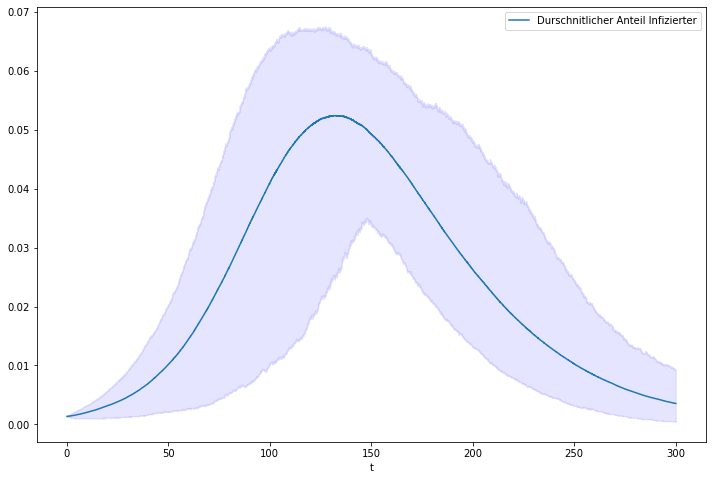

In [59]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(t, mean, label="Durschnitlicher Anteil Infizierter")
ax.plot(t, qhigh, color = "blue", alpha = 0.01)
ax.plot(t, qlow, color = "blue", alpha = 0.01)
ax.fill_between(t, qlow, qhigh, color = "blue", alpha = 0.1)
ax.legend()
ax.set_title("")
ax.set_ylabel("")
ax.set_xlabel("t")

Die Grafik zeigt, dass sich der Anteil gleichzeitig Infizierter im QC-SEIR-Modell bereits durch die Quarantäne-Maßnahmen und die damit verbundene Kontakt-Nachverfolgung mehr als halbieren lässt. Durchschittlich wären demnach in der Spitze der Pandemie knapp über 5 Prozent der Bevölkerung gleichzeitig infiziert. Die absolute Schwankungsbreite ist vergleichbar mit der im SEIR-Modell ohne Gegenmaßnahmen.

In [60]:
print (f"Maximaler Höchstanteil gleichzeitig Infizierter {np.max(InfectedData.max(axis=0)/N)}")
print (f"Minimaler Höchstanteil gleichzeitig Infizierter {np.min(InfectedData.max(axis=0)/N)}")

Maximaler Höchstanteil gleichzeitig Infizierter 0.08265670320790021
Minimaler Höchstanteil gleichzeitig Infizierter 0.0014851389897687754


Der maximale Höchstanteil gleichzeitig Infizierter beträgt im Modell mit Gegenmaßnahmen also etwa 8,2 Prozent, was einer Reduzierung um mehr als die Hälfte bedeutet. Ohne Gegenmaßnahmen lag diese bei 18,5 Prozent. Zudem erkennen wir am sehr geringen minimalen Höchstanteil gleichzeitig Infizierter, dass bei Gegenmaßnahmen auch extrem milde Pandemieverläufe möglich sind. Wir wollen diesen Punkt anhand der Werte der einzelnen Gruppen näher betrachten:

In [61]:
Q = pd.DataFrame(Q)
C = pd.DataFrame(C)
S = pd.DataFrame(S)
E = pd.DataFrame(E)
I = pd.DataFrame(I)
R = pd.DataFrame(R)

In [62]:
Tab = pd.DataFrame()
Tab["Group"] = ["Quarantined","Contact Isolated","Suspected", "Exposed", "Infectious", "Recovered"]
Tab["Median Peak"] = [np.median(Q.max(axis=0)/N),np.median(C.max(axis=0)/N),np.median(S.max(axis=0)/N), np.median(E.max(axis=0)/N), np.median(I.max(axis=0)/N), np.median(R.max(axis=0)/N)]
Tab["Maximal Peak"] = [np.max(Q.max(axis=0)/N),np.max(C.max(axis=0)/N),np.max(S.max(axis=0)/N), np.max(E.max(axis=0)/N), np.max(I.max(axis=0)/N), np.max(R.max(axis=0)/N)]
Tab["Minimal Peak"] = [np.min(Q.max(axis=0)/N),np.min(C.max(axis=0)/N),np.min(S.max(axis=0)/N), np.min(E.max(axis=0)/N), np.min(I.max(axis=0)/N), np.min(R.max(axis=0)/N)]

In [63]:
Tab

,Group,Median Peak,Maximal Peak,Minimal Peak
0,Quarantined,0.010582,0.014190,0.000241
1,Contact Isolated,0.096444,0.119533,0.001804
2,Suspected,0.998635,0.998635,0.998635
3,Exposed,0.016605,0.021054,0.001092
4,Infectious,0.038875,0.052343,0.000393
5,Recovered,0.549441,0.598505,0.004089


Wir sehen auch, dass die Spitzenwerte in den einzelnen Klassen bei Gegenmaßnahmen für deutlich mildere Verläufe der Pandemie  sprechen. So reduziert sich etwa die durchschnittliche Anzahl von genesenen Individuen (R) im Median von 79,8 Prozent auf 54,9 Prozent. 

Bei statistischem Vergleich der Spitzenwerte fällt eine asymmetrische Verteilung der möglichen Pandemie-Verläufe auf. Während der Median und der Maximal-Wert vergleichsweise dicht beeinander liegen, liegt der Minimalwert in allen Klassen bei unter 1%. (Die Anteile von S sind trivialerweise gleich.) Dies spiegelt auch, wie oben bemerkt, die Tatsache wieder, dass bei Gegenmaßnahmen ein vorläufiges Erliegen der Pandemie wahrscheinlicher wird. Wir sehen dies auch in der Betrachtung der Extrem-Verläufe:

In [64]:
# Identifizierung der Extrem- und Durchschnittsverläufe anhand der Simulationsdaten
SusceptiblesMin = return_min_progression(S)
SusceptiblesMax = return_max_progression(S)
SusceptiblesMean = return_mean(S)

Text(0.5, 0, 't')

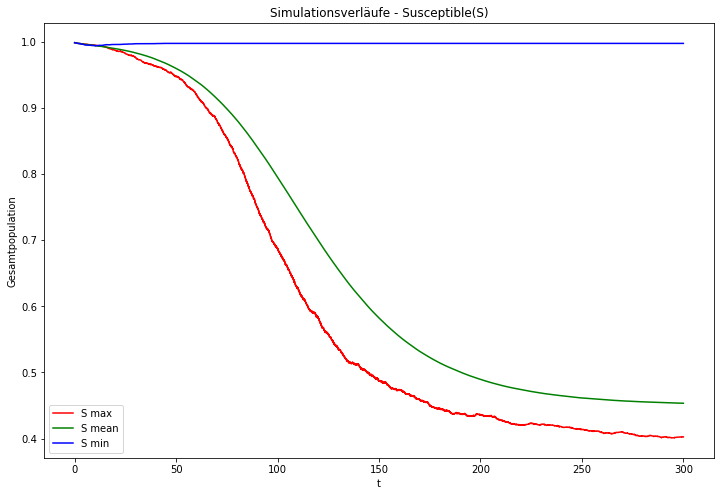

In [65]:
fig, ax = plt.subplots(figsize = (12,8))
ax.plot(t, SusceptiblesMax/N, label="S max", color = "r")
ax.plot(t, SusceptiblesMean/N, label="S mean", color = "g")
ax.plot(t, SusceptiblesMin/N, label="S min", color = "b")
ax.legend()
ax.set_title("Simulationsverläufe - Susceptible(S)")
ax.set_ylabel("Gesamtpopulation")
ax.set_xlabel("t")

Wir sehen also, dass die Pandemie beim mildesten, möglichen Verlauf frühzeitig zum Erliegen kommt. Geschieht diese nicht, so beobachten wir den bekannten ausgeprägten S-förmigen Verlauf. Der schwerste Pandemie-Verlauf ist dabei nicht näher am Durschschnittsverlauf, als der Milde. Anzumerken ist auch, dass der schwerste, beobachtete Pandemie-Verlauf bei Quarantäne-Maßnahmen milder ist, als bei dem mildesten beobachteten Verlauf ohne Gegenmaßnahmen im Abschnitt 3. 

Nun untersuchen wir, wie wahrscheinlich ein frühzeitiges Erliegen der Pandemie bei den zuvor eingeführten Gegenmaßnahmen wäre. Dazu betrachten wir die den Anteil der Genesenen nach einem Jahr (t=300).

Anteil and Pandemieverläufen mit R/N<0.05: 0.007


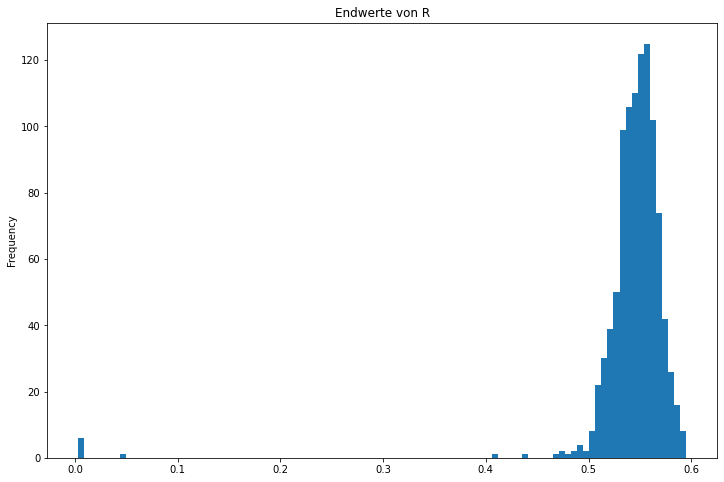

In [66]:
fig, ax = plt.subplots(figsize = (12,8))
(R.iloc[-1]/N).plot(ax=ax, kind='hist', bins=100, title= "Endwerte von R")

print (f"Anteil and Pandemieverläufen mit R/N<0.05: {((R.iloc[-1]/N<0.05).astype(int)).sum()/J}")

Das Histogramm zeigt, dass ein vorzeitiges Erliegen der Pandemie auch bei den betrachteten Quarantäne-Maßnahmen eine Ausnahme-Situation darstellt. Die meisten beobachteten Pandemieverläufe enden mit einer Durchseuchungsrate von 50 bis 60 Prozent. Wenn man eine Durchseuchungsrate von weniger als 5 Prozent als Kriterium für ein vorzeitiges Erliegen der Infektionsdynamik hernanzieht, suggerieren unsere Simulationsdurchläufe eine Wahrscheinlichkeit von 0,6 Prozent für ein vorzeitiges Erliegen der Pandemie.

## 5. Fazit

Die Modellierung der Pandemie-Simulation anhand des deterministischen und stochastischen Modells zeigt deutlich, dass eine ungebremste Ausbreitung der Covid-19-Pandemie in Deutschland zu hohen Infektionszahlen und damit aller Voraussicht nach zu einer Überforderung der Kapazitäten des hiesigen Gesundheitssystems geführt hätte. Die Simulationsergebnisse deuten darauf hin, dass die Durchsetzung von Quarantänemaßnahmen für Infizierter und Kontaktpersonen eine effektes Mittel der Bundes- und Landesregierungen darstellen, die Ausbreitung der Infektion zu verlangen. Ein verlangsamtes Infektionsgeschen führt zu einer geringeren Anzahl gleichzeitig Infizierter und infolgedessen auch zu einer Reduzierung der Belastung auf das Gesundheitssystem. Im Rahmen der Simulation des QC-SEIR-Modells nach dem stochastischen Ansatz wurde nur in einzelnen, wenigen Fällen ein vorzeitiges Erliegen der Pandemie registriert. Anhand der Untersuchungserbenisse erscheint ein "Ausfall" der Pandemie mit den zur Kalibrierung gewählten Parametern, die sich an der realen Situation in Deutschland im März 2020 orientieren, also sehr unwahrscheinlich. 

Abschließend bleibt festzustellen, dass die Simulation nach dem SEIR-Modell in der hier vogestellten Ausprägungen nur eine schematische Darstellung realer Pandemieverläufe ermöglicht. Um die Aussagefähigkeit im Modell zu erhöhen könnten weitere Faktoren integriert werden. Denkbar wäre etwa die Berücksichtigung demographischer Entwicklungen, zeitlich beschränkter Immunitäten, sowie saisonaler und überregionaler Einflüsse auf das Infektionsgeschehen im Rahmen der Pandemie.